# Introduction to LArTPC MLReco3D Analysis Tools

This notebook is a tutorial on how to use trained models in `lartpc_mlreco3d` for high level physics analysis, including but not limited to event selection. The purpose of this tutorial is to make inference and physics analysis using neural network models of `lartpc_mlreco3d` more accessible to non-experts and to make the process of asking simple questions (ex. how many particles in given image?) independent from knowing implementation details of separate sub-modules (which may include specific settings on hyperparameters and post-processing scripts). The tutorial is designed as follows:

 * Overview of `lartpc_mlreco3d.analysis` (analysis helper functions and classes)
 * `Particle` and `Interaction` Data Structures
 * Running post-ml chain algorithms from `post_processing`
 * How to run inference and save information via `analysis/run.py`.

Please send questions and any bug reports to the ``#lartpc-mlreco3d`` channel on SBN Slack workspace.


## 1. Overview of `lartpc_mlreco3d.analysis`

[comment]: # (Why we need analysis)

The ML full chain (`lartpc_mlreco3d/mlreco/models/full_chain.py`) is a combination of multiple (convolutional and graphical) neural networks, chained together to build information from the bottom-up direction while extracting useful features on each level of detail. However, in many cases the level of detail provided by both the full chain code and its output is too excessive for asking simple high-level questions, such as:

 * How many interactions are there in this image?
 * How many leptons does this interaction contain?
 * What is the five-particle classification accuracy for this model?
 * What is the signal (however one defines it) selection efficiency/purity?

Although it is possible to answer these questions using the output dictionary of the full chain, the pathway to that often involves asking people around how to set hyperparameters, how to call some specific post-processing functions, what convention to use when selecting viable particle/interaction candidates, etc.

The `lartpc_mlreco3d` analysis tools are designed to organize full chain output information into more human-readable format and provide an common and convenient user interface to perform high level analysis without requiring explicit knowledge of the full chain submodules. The tools are stored under `lartpc_mlreco3d/analysis`, which is outside of all neural-network related works in `lartpc_mlreco3d/mlreco` (on purpose). The practical usage of the analysis code will be much more transparent through demonstration using the full chain.

> **Note**
> Please use the latest `develop` branch from the main repository `DeepLearningPhysics/lartpc_mlreco3d/develop`. Also from now on, we will use the HDF5 recosntruction outputs instead of running the full chain on notebook (hence, there will be no need for GPUs). 


In [1]:
# Basic boilerplate imports
import numpy as np
import pandas as pd
import yaml, os, sys, re

# Visualization Tools
import plotly
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import matplotlib.pyplot as plt
import seaborn as sns
from pprint import pprint

In [2]:
# Set paths
DATA_PATH = '/sdf/data/neutrino/icarus/workshop2023/reco/mpvmpr_mini_raw.h5'
LARTPC_MLRECO_PATH = "/sdf/group/neutrino/koh0207/lartpc_mlreco3d/"
sys.path.append(LARTPC_MLRECO_PATH)

## 2. Loading reconstruction outputs to build data structures.

When performing event selection analysis, it is often convenient to organize information into units of particles and interactions:

 * A **`Particle`** is a set of voxels (energy depositions) that is predicted to have originated from the same underlying particle. Voxels in a **`Particle`** object share the same predicted **`group_id`**. 
 * A **`TruthParticle`** is a set of voxels that originated from the same underlying G4 particle. Voxels in a **`TruthParticle`** object share the same true **`group_id`**.
 * An **Interaction** is a set of **`Particles`** that have originated from the same vertex. Voxels that belong to the same **`Interaction`** share the same **`interaction_id`**. 
 * A **`TruthInteraction`** is a collection of **`TruthParticles`** that have originated from the same true vertex. 

As such, Particle and Interaction are predicted quantities reconstructed from the ML chain, while their “true” counterparts are quantities defined using true labels. Although the two classes share many of their properties, we deliberately decide to separate any truth information from interfering with predicted quantities.

> **Note**: 
> **`Particles`** and **`Interactions`** are not stored "as-is" in the output `.h5` file (rather, we save the "blueprints" for both objects, and later they are built from existing information). Hence, before introducing the high level tools, we will first describe how stored HDF5 data is loaded and transformed to each data structures. 

In [3]:
from mlreco.iotools.readers import HDF5Reader
from mlreco.utils.globals import *

Welcome to JupyROOT 6.22/08


In [4]:
# Register HDF5 to reader
reader = HDF5Reader(DATA_PATH, to_larcv=True)

Registered /sdf/data/neutrino/icarus/workshop2023/reco/mpvmpr_mini_raw.h5


The `reader.get(iteration, nested=True)` method retrieves the stored reconstruction output corresponding to entry number `iteration`.

In [5]:
# Load data and result dictionary
data, result = reader.get(0, nested=True)

In [6]:
entry = 0

### 2-a. Constructing **Particle** objects from HDF5

A [**Particle**](https://github.com/DeepLearnPhysics/lartpc_mlreco3d/blob/develop/analysis/classes/Particle.py) is a reconstructed object representing a set of voxels that are predicted to have originated from the same particle. It has the following attributes:

 * Integers
     * `id`: the unique ID value of the particle.
     * `pid`: predicted PID value (particle type).
     * `interaction_id`: the ID of the interaction for which this particle belongs to.
     * `nu_id`: indicator for nu-like (`nu_id=1`) or cosmic-like (`nu_id=0`) interactions.
     * `volume_id`: indicator for which cryo (east=0, west=1) the particle belongs to.
     * `image_id`: "index" value of the image containing this particle. 
     * `semantic_type`: shape label (track, shower, michel, delta, lowE) of the particle. 
     * `is_primary`: indicator for primary (`is_primary=1`) or non-primary (`is_primary=0`) 
 * Floats
     * `csda_kinetic_energy`: range-based kinetic energy (only tracks, `default=-1`)
     * `length`: reconstructed particle length (only tracks, `default=-1`)
 * IntArray
     * `index`: N x 1 array of voxel indices that defines this particle.
 * FloatArray
     * `points`: N x 3 array of voxel 3d coordinates. 
     * `depositions`: N x 1 array of rescaled ADC values
     * `pid_scores`: 1 x 5 array of PID classification softmax scores. 
     * `primary_scores`: 1 x 2 array of Primary classification softmax scores. 
     * `start_point`: 1 x 3 array, defines particle (predicted) start point. 
     * `end_point`: 1 x 3 array, defines particle (predicted) end point. 
     * `start_dir`: 1 x 3 array, defines particle (predicted) momentum direction (unit vector).
     * `match`: 1 x ? array, contains `id` value of **`TruthParticles`** that are matched to this particle.
     * `match_counts`: 1 x ? array, contains IoU value of the match

As such, it is defined by the outputs from particle clustering, namely:
 * `input_data` (or `input_rescaled`): input 3D spacepoint image
 * `particle_clusts`: same as `index`
 * `particle_seg`: majority semantic segmentation label of this cluster (same as `semantic_type`).
 
There are other secondary attributes that are products of the ML chain:
 * `particle_start_points`: start points of particles. 
 * `particle_end_points`: end points of particles (only tracks).
 * `particle_group_pred`: predicted interaction ID assignment of this particle. 
 * `particle_node_pred_type`: predicted PID prediction scores (logits).
 * `particle_node_pred_vtx`: predicted primary ID scores (logits).
 
> **Note:**
> We don't save 3D points for each particle separately to HDF5 to reduce file size. We only need the relative voxel index information (`particle_clusts`) to associate spacepoints to particles. 

In [7]:
print('Total number of voxels in image {}: {}'.format(entry, result['input_rescaled'][entry].shape[0]))
# Check that all of the following lists have the same length!
print("Number of particles in image {}: {}".format(entry, len(result['particle_clusts'][entry])))
print('Length of "particle_clusts":', len(result['particle_clusts'][entry]))
print('Length of "particle_seg":', len(result['particle_seg'][entry]))

print('Length of "particle_start_points":', len(result['particle_start_points'][entry]))
print('Length of "particle_end_points":', len(result['particle_end_points'][entry]))
print('Length of "particle_group_pred":', len(result['particle_group_pred'][entry]))
print('Length of "particle_node_pred_type":', len(result['particle_node_pred_type'][entry]))
print('Length of "particle_node_pred_vtx":', len(result['particle_node_pred_vtx'][entry]))

Total number of voxels in image 0: 19726
Number of particles in image 0: 39
Length of "particle_clusts": 39
Length of "particle_seg": 39
Length of "particle_start_points": 39
Length of "particle_end_points": 39
Length of "particle_group_pred": 39
Length of "particle_node_pred_type": 39
Length of "particle_node_pred_vtx": 39


Each particle's 3d spacepoints could be obtained from masking the full image with the correspond entry in `particle_clusts`, for example:

In [8]:
# Take first particle (0th particle)
indices = result['particle_clusts'][entry][0]
points = result['input_rescaled'][entry][indices]
# print first five points
print(points[:5, :])

[[   0.        595.         72.       5213.        100.63163 ]
 [   0.        595.         71.       5214.         84.91867 ]
 [   0.        596.         71.       5214.         70.431404]
 [   0.        595.         72.       5214.        111.455894]
 [   0.        595.         73.       5214.         97.132515]]



 * Column 0 (with value `0` or `1`) refers to the `volume_id` of the particle (0 for east, 1 for west cryostat). 
 * Columns 1 to 3 are the 3D coordinates of the particle's 3d spacepoints. 
 * Column 4 are the rescaled ADC values of the spacepoints. 
 
Each "particle" scope entry inside the `result` dictionary is sorted; the start point of the 5th particle `result['particle_clusts'][entry][4]` is stored at `result['particle_start_points'][entry][4]`. 
To build `Particle` objects from ML output information, let us make a function `build_reco` that takes `entry`, `data`, `result` as inputs.

In [9]:
from scipy.special import softmax
from analysis.classes.data import *

In [10]:
def build_reco(entry, data, result):
    """
    Function to build Particle objects from data and result dicts.
    
    Inputs
    ------
    entry: int
        Entry number of current image
    data: dict
        Data dictionary obtained from HDF5 Reader
    result: dict
        Result dictionary obtained from HDF5 Reader
        
    Returns
    -------
    particles: List[Particle]
        list of Particle objects constructed from HDF5 data.
    """
    out = []

    # Essential Information
    image_index      = data['index'][entry]
    if 'input_rescaled' in result:
        input_voxels     = result['input_rescaled'][entry]
    else:
        input_voxels     = data['input_data'][entry]

    volume_labels    = input_voxels[:, BATCH_COL]
    point_cloud      = input_voxels[:, COORD_COLS]
    depositions      = input_voxels[:, 4]

    particles        = result['particle_clusts'][entry]
    particle_seg     = result['particle_seg'][entry]

    particle_start_points = result['particle_start_points'][entry][:, COORD_COLS]
    particle_end_points   = result['particle_end_points'][entry][:, COORD_COLS]
    inter_ids             = result['particle_group_pred'][entry]

    type_logits           = result['particle_node_pred_type'][entry]
    primary_logits        = result['particle_node_pred_vtx'][entry]

    pid_scores     = softmax(type_logits, axis=1)
    primary_scores = softmax(primary_logits, axis=1)
    
    # Loop over each cluster prediction in particle_clusts
    for i, p in enumerate(particles):
        # For volume ID, we take the majority label. 
        volume_id, cts = np.unique(volume_labels[p], return_counts=True)
        volume_id = int(volume_id[cts.argmax()])
        # Semantic segmentation prediction
        seg_label = particle_seg[i]
        # Interaction prediction
        interaction_id = inter_ids[i]
        part = Particle(group_id=i, # Particle ID
                        interaction_id=interaction_id, # ID of interaction for which the particle belongs to
                        image_id=image_index, # Index of current image in dataset
                        semantic_type=seg_label, # Shape (semantic segmentation) label
                        index=p, # The voxel index mask used to retrieve particle space points. 
                        points=np.ascontiguousarray(point_cloud[p]), # 3D spacepoints of this particle (predicted nonghost)
                        depositions=depositions[p], # Depositions, in terms of ADC or MeV (depends on your dataset)
                        volume_id=volume_id, # Volume ID 
                        pid_scores=pid_scores[i], # PID softmax scores of this particle) 
                        primary_scores=primary_scores[i], # Primary softmax scores of this particle
                        start_point = np.ascontiguousarray(particle_start_points[i]), # Start point
                        end_point = np.ascontiguousarray(particle_end_points[i])) # End point

        out.append(part)

    return out

In [40]:
particles = build_reco(0, data, result)

### 2-b. Visualizing **Particle** Objects

Let us first print out every particle in a given image:

In [38]:
# Examine all particles in image 0
for p in particles:
    print(p)

Particle( Image ID=0   | Particle ID=0   | Semantic_type: Delta       | PID: Electron | Primary: 0  | Interaction ID: 29 | Size: 44    | Volume: 0  | Match: [] )
Particle( Image ID=0   | Particle ID=1   | Semantic_type: Delta       | PID: Electron | Primary: 0  | Interaction ID: 4  | Size: 69    | Volume: 0  | Match: [] )
Particle( Image ID=0   | Particle ID=2   | Semantic_type: Shower      | PID: Photon   | Primary: 0  | Interaction ID: 22 | Size: 14    | Volume: 0  | Match: [] )
Particle( Image ID=0   | Particle ID=3   | Semantic_type: Shower      | PID: Photon   | Primary: 0  | Interaction ID: 3  | Size: 24    | Volume: 0  | Match: [] )
Particle( Image ID=0   | Particle ID=4   | Semantic_type: Shower      | PID: Photon   | Primary: 0  | Interaction ID: 4  | Size: 45    | Volume: 0  | Match: [] )
Particle( Image ID=0   | Particle ID=5   | Semantic_type: Shower      | PID: Photon   | Primary: 0  | Interaction ID: 5  | Size: 581   | Volume: 0  | Match: [] )
Particle( Image ID=0   | Par

Compared to prior data formats involving multiple different reconstruction outputs, it is now much easier to get a sense of what's happening in a given image.

We will use [**Plotly**](https://plotly.com/python/) for event displays. There are also several ready-made helper functions under `mlreco.visualization` that sets up all the boilerplate code for plotly formatting.

In [41]:
from mlreco.visualization.points import get_event_displays
from mlreco.visualization.plotly_layouts import plotly_layout3d

`trace_particles` is a convenient function to make 3D events displays for a list of Particle objects.

In [67]:
traces = get_event_displays(particles, 
                            color='depositions', 
                            size=1, 
                            mode='points', 
                            colorscale='jet',
                            cmax=200)

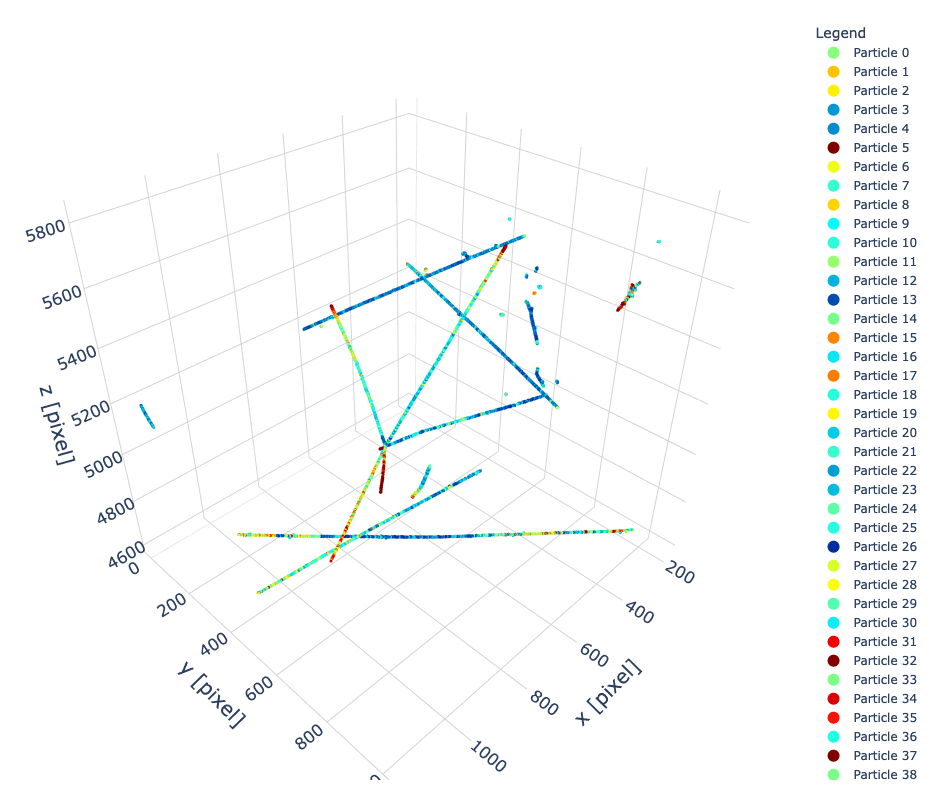

In [69]:
make_plots = True
if make_plots:
    fig = make_subplots(rows=1, cols=1,
                        specs=[[{'type': 'scatter3d'}]],
                        horizontal_spacing=0.05, vertical_spacing=0.04)

    fig.add_traces(traces, rows=len(traces) * [1], cols=len(traces) * [1])

    fig.layout = plotly_layout3d()
    fig.update_layout(showlegend=True,
                      legend=dict(xanchor="left"),
                     autosize=True,
                     height=800,
                     width=800,
                     margin=dict(r=20, l=20, b=20, t=20))
    iplot(fig)

### 3-a. Constructing **TruthParticle** objects from HDF5

A [**TruthParticle**](https://github.com/DeepLearnPhysics/lartpc_mlreco3d/blob/develop/analysis/classes/TruthParticle.py) is a ground-truth equivalent of **Particle**; 
namely, a data structure mirroring **Particle** but reserved for true particles derived from true labels and true MC information. Different from reco particles that could only be
assigned a predicted nonghost (post-prediction ghost-masking) 3D spacepoint, three distinct 3D point information may be assigned to a given **TruthParticle**:
 * **SimEnergyDeposits (`TruthParticle.sed_points`)**: the 3D coordinate and deposition value obtained from G4 without any detector effects or reference to Cluster3D spacepoint building. These are the "absolute true" points that may be obtained from the G4 generator.
 * **True Nonghost Points (`TruthParticle.truth_points`)**: the 3D coordinate and deposition value obtained from true labels for deghosting. This includes detector and Cluster3D effects, and may be interpreted as the ML chain's available 3D voxels in the case of perfect deghosting (best case scenario). 
 * **Prediction Nonghost Points (`TruthParticle.points`)**: 3D points and deposition value, obtained from predicted deghosting labels. This includes one ML reconstruction effect, namely deghosting. 
 
Each **TruthParticle** is assigned a unique ID, which is derived from `larcv::Particle` (the data structure used to generate particles spacepoints in Supera).

In [70]:
sed_points      = data['sed'][entry]
truth_points    = data['cluster_label'][entry]
larcv_particles = data['particles_asis'][entry]
# `points` involve reconstruction, hence stored under the `result` dict
points          = result['cluster_label_adapted'][entry]

In [71]:
print("Number of True LArCV Particles = ", len(larcv_particles))
print("Number of SimEnergyDeposit Points = ", len(sed_points))
print("Number of True Nonghost Points = ", len(truth_points))
print("Number of Predicted Nonghost Points = ", len(points))

Number of True LArCV Particles =  71
Number of SimEnergyDeposit Points =  14703
Number of True Nonghost Points =  19672
Number of Predicted Nonghost Points =  19726


In the case for **TruthParticles**, the labels are derived from the tensor label information (`data['cluster_label']` or `result['cluster_label_adapted']`). We first make a helper function that takes the **TruthParticle** mask (voxel indices) and returns the majority vote label for semantic, interaction, neutrino, primary, and type label. 

In [72]:
def get_truth_particle_labels(labels_nonghost, mask, id=-1, verbose=False):
    """
    Helper function for fetching true particle labels from 
    voxel label array. 
    
    Parameters
    ----------
    labels: np.ndarray
        Predicted nonghost voxel label information
    mask: np.ndarray
        Voxel index mask
    id: int, optional
        Unique id of this particle (for debugging)
    """
    
    # Semantic Type
    semantic_type, sem_counts = np.unique(labels_nonghost[mask][:, -1].astype(int), 
                                            return_counts=True)
    if semantic_type.shape[0] > 1:
        if verbose:
            print("Semantic Type of Particle {} is not "\
                "unique: {}, {}".format(id,
                                        str(semantic_type),
                                        str(sem_counts)))
        perm = sem_counts.argmax()
        semantic_type = semantic_type[perm]
    else:
        semantic_type = semantic_type[0]
    
    # Interaction ID
    interaction_id, int_counts = np.unique(labels_nonghost[mask][:, 7].astype(int),
                                        return_counts=True)
    if interaction_id.shape[0] > 1:
        if verbose:
            print("Interaction ID of Particle {} is not "\
                "unique: {}".format(id, str(interaction_id)))
        perm = int_counts.argmax()
        interaction_id = interaction_id[perm]
    else:
        interaction_id = interaction_id[0]

    # Neutrino ID
    nu_id, nu_counts = np.unique(labels_nonghost[mask][:, 8].astype(int),
                                return_counts=True)
    if nu_id.shape[0] > 1:
        if verbose:
            print("Neutrino ID of Particle {} is not "\
                "unique: {}".format(id, str(nu_id)))
        perm = nu_counts.argmax()
        nu_id = nu_id[perm]
    else:
        nu_id = nu_id[0]
        
    # Primary ID
    primary_id, primary_counts = np.unique(labels_nonghost[mask][:, 11].astype(int),
                                return_counts=True)
    if primary_id.shape[0] > 1:
        if verbose:
            print("Primary ID of Particle {} is not "\
                "unique: {}".format(id, str(primary_id)))
        perm = primary_counts.argmax()
        primary_id = primary_id[perm]
    else:
        primary_id = primary_id[0]
        
    # Primary ID
    pid, pid_counts = np.unique(labels_nonghost[mask][:, 9].astype(int),
                                return_counts=True)
    if pid.shape[0] > 1:
        if verbose:
            print("Primary ID of Particle {} is not "\
                "unique: {}".format(id, str(pid)))
        perm = pid_counts.argmax()
        pid = pid[perm]
    else:
        pid = pid[0]
        
    return semantic_type, interaction_id, nu_id, pid, primary_id


> **Note**
> In almost all cases, each of the processed labels in `get_truth_particle_labels` will be unique (unanimous vote, rather than majority vote).

In [73]:
# Example
particle_id = 1
mask = truth_points[:, 6] == particle_id
label_info = get_truth_particle_labels(truth_points, mask, id=particle_id, verbose=True)
print("Semantic Type = {}, Interaction ID = {}, Neutrino ID = {}, PID = {}, Primary ID = {}".format(*label_info))

Semantic Type = 1, Interaction ID = 0, Neutrino ID = 1, PID = 4, Primary ID = 1


For **TruthParticles**, it is possible that (due to deghosting mistakes) there are no predicted nonghost voxels for a corresponding set of true nonghost voxels. In such cases where a given **TruthParticle** is missing predicted nonghost points entirely, we still keep that **TruthParticle** if it has a non-zero true nonghost deposition in the image (i.e., if `truth_points > 0`). Handling these "empty truth particles" is implemented in `handle_empty_truth_particles`:

In [74]:
from analysis.classes.builders import handle_empty_truth_particles

As with **Particles**, we implement a function to build **TruthParticles** from saved HDF5 information. Please read the inline comments to firmly get a sense of how we construct **TruthParticles**!

In [75]:
from typing import List
def build_truth(entry: int, data: dict, result: dict) -> List[TruthParticle]:
    """
    Returns
    -------
    out : List[TruthParticle]
        list of true TruthParticle instances of length equal to the
        batch size. 
    """

    out = []
    image_index     = data['index'][entry]
    labels          = result['cluster_label_adapted'][entry]
    # List of Particle IDs in predicted nonghost labels
    particle_ids    = set(list(np.unique(labels[:, 6]).astype(int)))
    # True Nonghost label tensor (contains voxel coordinates and labels)
    labels_nonghost = data['cluster_label'][entry]
    # List of larcv::Particles
    larcv_particles = data['particles_asis'][entry]

    # Predicted nonghost masked input
    rescaled_charge = result['input_rescaled'][entry][:, 4]
    coordinates     = result['input_rescaled'][entry][:, COORD_COLS]
    
    # Detector boundary and px to cm unit conversion meta info
    meta            = data['meta'][0]
    # Sim Energy Deposits
    simE_deposits   = data['sed'][0]

    # Loop over each larcv::Particle
    for i, lpart in enumerate(larcv_particles):
        # The ID is defined by the larcv::Particle's .id() attribute
        id = int(lpart.id())
        
        # TruthParticle's true nonghost mask
        mask_nonghost = labels_nonghost[:, 6].astype(int) == id
        # Skip larcv particles with no true depositions
        if np.count_nonzero(mask_nonghost) <= 0:
            continue
        coords_noghost      = labels_nonghost[mask_nonghost][:, COORD_COLS] # True Nonghost coordinates
        true_voxel_indices  = np.where(mask_nonghost)[0]
        depositions_noghost = labels_nonghost[mask_nonghost][:, VALUE_COL].squeeze()
        
        # Get majority vote for volume label
        volume_labels       = labels_nonghost[mask_nonghost][:, BATCH_COL]
        volume_id, cts      = np.unique(volume_labels, return_counts=True)
        volume_id           = int(volume_id[cts.argmax()])
        
        # 1. Process particle-level labels
        truth_labels = get_truth_particle_labels(labels_nonghost, 
                                                 mask_nonghost, 
                                                 id=id)
        semantic_type  = int(truth_labels[0])
        interaction_id = int(truth_labels[1])
        nu_id          = int(truth_labels[2])
        pid            = int(truth_labels[3])
        primary_id     = int(truth_labels[4])
        is_primary     = int(primary_id) == 1
        
        # TruthParticle's sim energy deposit mask
        mask_sed      = simE_deposits[:, 5].astype(int) == id
        # Voxel index for sim energy deposits
        sed_index     = np.where(mask_sed)[0]
        if simE_deposits is not None:
            sed_points          = simE_deposits[mask_sed][:, COORD_COLS].astype(np.float32)
        else:
            sed_points          = np.array([])
        # 1. Check if current pid is one of the existing group ids
        if id not in particle_ids:
            particle = handle_empty_truth_particles(labels_nonghost, 
                                                    mask_nonghost, 
                                                    lpart, 
                                                    image_index,
                                                    unit_convert=lambda x: x, # Don't worry about this, option for converting units from px to cm which we omit here
                                                    sed=simE_deposits,
                                                    mask_sed=mask_sed)
            out.append(particle)
            continue

        # 2. Process voxels
        # TruthParticle's predicted nonghost mask.
        mask = labels[:, 6].astype(int) == id
        coords              = coordinates[mask] # Predicted nonghost coordinates
        voxel_indices       = np.where(mask)[0] # Predicted nonghost voxel indices

        depositions_MeV     = labels[mask][:, VALUE_COL] # Predicted nonghost depositions (in MeV)
        depositions         = rescaled_charge[mask] # Predicted nonghost depositions (in ADC)
        
        # 3. Construct TruthParticle object

        particle = TruthParticle(group_id=id,
                                 interaction_id=interaction_id, 
                                 nu_id=nu_id,
                                 pid=pid, 
                                 image_id=image_index,
                                 volume_id=volume_id,
                                 semantic_type=semantic_type, 
                                 index=voxel_indices,
                                 points=coords,
                                 depositions=depositions,
                                 depositions_MeV=depositions_MeV,
                                 truth_index=true_voxel_indices,
                                 truth_points=coords_noghost,
                                 truth_depositions=np.empty(0, dtype=np.float32), #TODO
                                 truth_depositions_MeV=depositions_noghost,
                                 sed_index=sed_index.astype(np.int64),
                                 sed_points=sed_points,
                                 is_primary=bool(is_primary),
                                #  pid=pdg,
                                 particle_asis=lpart)

        out.append(particle)

    return out

### 3-b. Visualizing **TruthParticle** Objects

As we did for **Particles** we can print out **TruthParticles** and visualize them using `trace_particles`:

In [76]:
truth_particles = build_truth(entry, data, result)

In [77]:
# Examine all particles in image 0
for p in truth_particles:
    print(p)

TruthParticle( Image ID=0   | Particle ID=0   | Semantic_type: Track       | PID: Proton   | Primary: 1  | Interaction ID: 0  | Size: 22    | Volume: 0  | Match: [] )
TruthParticle( Image ID=0   | Particle ID=1   | Semantic_type: Track       | PID: Proton   | Primary: 1  | Interaction ID: 0  | Size: 1707  | Volume: 0  | Match: [] )
TruthParticle( Image ID=0   | Particle ID=2   | Semantic_type: Track       | PID: Muon     | Primary: 1  | Interaction ID: 0  | Size: 510   | Volume: 0  | Match: [] )
TruthParticle( Image ID=0   | Particle ID=3   | Semantic_type: Track       | PID: Proton   | Primary: 1  | Interaction ID: 0  | Size: 418   | Volume: 0  | Match: [] )
TruthParticle( Image ID=0   | Particle ID=4   | Semantic_type: Track       | PID: Proton   | Primary: 1  | Interaction ID: 0  | Size: 1261  | Volume: 0  | Match: [] )
TruthParticle( Image ID=0   | Particle ID=5   | Semantic_type: Track       | PID: Pion     | Primary: 1  | Interaction ID: 0  | Size: 981   | Volume: 0  | Match: [] 

In [90]:
traces_reco = get_event_displays(particles, color='interaction_id', size=1, mode='points', colorscale='rainbow')

In [91]:
traces_true = get_event_displays(truth_particles, color='interaction_id', size=1, mode='sed_points', colorscale='rainbow')

Let us plot **Particles** and **TruthParticles** of the same image side by side:

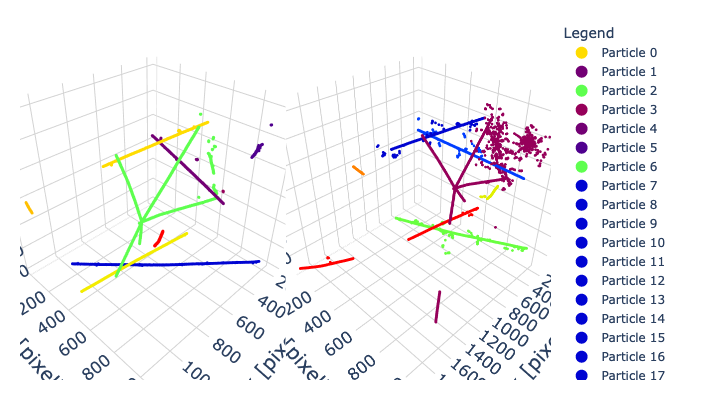

In [94]:
make_plots = True
if make_plots:
    fig = make_subplots(rows=1, cols=2,
                        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                        horizontal_spacing=0.05, vertical_spacing=0.04)

    fig.add_traces(traces_reco, rows=len(traces) * [1], cols=len(traces) * [1])
    fig.add_traces(traces_true, rows=len(traces_true) * [1], cols=len(traces_true) * [2])

    fig.layout = plotly_layout3d()
    fig.update_layout(showlegend=True,
                      legend=dict(xanchor="left"),
                     autosize=True,
                     height=400,
                     width=800,
                     margin=dict(r=20, l=20, b=20, t=20))
    iplot(fig)

Recall that for **TruthParticles**, there were three different 3D point information available (`sed_points`, `truth_points`, and `points`). 
It is possible to use `trace_particles` to display the different voxels separately, using the `mode` keyword argument. For example:

In [95]:
# Predicted Nonghost
traces_png = get_event_displays(truth_particles, color='id', size=1, mode='points', colorscale='rainbow')
# True Nonghost
traces_tng = get_event_displays(truth_particles, color='id', size=1, mode='truth_points', colorscale='rainbow')
# SimEnergyDeposit
traces_sed = get_event_displays(truth_particles, color='id', size=1, mode='sed_points', colorscale='rainbow')

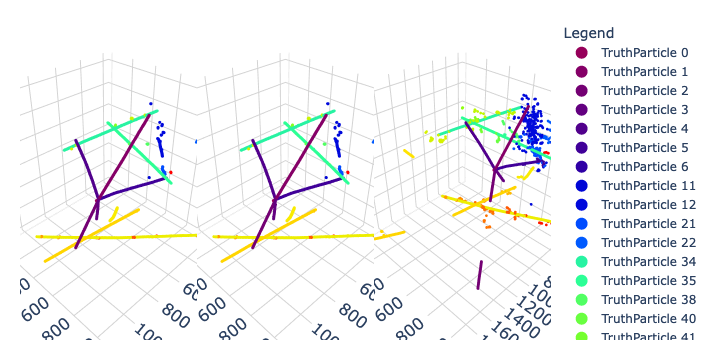

In [96]:
make_plots = True
if make_plots:
    fig = make_subplots(rows=1, cols=3,
                        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                        horizontal_spacing=0.05, vertical_spacing=0.04)

    fig.add_traces(traces_png, rows=len(traces_png) * [1], cols=len(traces_png) * [1])
    fig.add_traces(traces_tng, rows=len(traces_tng) * [1], cols=len(traces_tng) * [2])
    fig.add_traces(traces_sed, rows=len(traces_sed) * [1], cols=len(traces_sed) * [3])

    fig.layout = plotly_layout3d()
    fig.update_layout(showlegend=True,
                      legend=dict(xanchor="left"),
                     autosize=True,
                     height=300,
                     width=1000,
                     margin=dict(r=20, l=20, b=20, t=20))
    iplot(fig)

## 4. Interaction

An [**Interaction**](https://github.com/DeepLearnPhysics/lartpc_mlreco3d/blob/develop/analysis/classes/Interaction.py) is a collection of **`Particles`** that have originated from the same vertex. It has the following attributes:

 * Integers
     * `id`: the unique ID value of the interaction. (`interaction_id`)
     * `nu_id`: indicator for nu-like (`nu_id=1`) or cosmic-like (`nu_id=0`) interactions.
     * `volume_id`: indicator for which cryo (east=0, west=1) the interaction belongs to.
     * `image_id`: "index" value of the image containing this interaction. 
     * `crthit_id`: ID of the matched `crthit` object (used in CRT matching)
     * `flash_id`: ID of the matched `Flash_t` object (used in flash matching)
 * Floats
     * `flash_time`: range-based kinetic energy (only tracks, `default=-1`)
     * `length`: reconstructed particle length (only tracks, `default=-1`)
 * IntArray
     * `index`: N x 1 array of voxel indices that defines this interaction.
     * `particle_counts`: 1 x 6 array, where `self.particle_counts[pid]` contains the counts for particle type `pid`. 
     * `primary_counts`: 1 x 6 array, same as `particle_counts` but only counts primaries. 
 * FloatArray
     * `points`: N x 3 array of voxel 3d coordinates. 
     * `depositions`: N x 1 array of rescaled ADC values
     * `match`: 1 x ? array, contains `id` value of **`TruthInteractions`** that are matched to this particle.
     * `vertex`: 1 x 3 array for the interaction vertex. 
 * Other
     * `particles`: list of **`Particle`** objects that belong to this interaction.
     * `topology`: summary string of the interaction's primary (ex. `1e1p`, `1mu`, `1e2g2p`)
     
Normally, we build `Interaction` from a list of `particles` with the same predicted `interaction_id`. 

In [105]:
def group_particles_to_interactions_fn(particles : List[Particle],
                                       mode='pred',
                                       verbose=False):
    """
    Function for grouping particles to its parent interactions.

    Parameters
    ----------
    particles: List[Particle]
        List of Particle instances to construct Interaction instances from.
    get_nu_id: bool
        Option to retrieve neutrino_id (unused)
    mode: str
        Supported modes:
        'pred': output list will contain <Interaction> instances
        'truth': output list will contain <TruthInteraction> instances.

        Do not mix predicted interactions with TruthInteractions and
        interactions constructed from using labels with Interactions.
    """
    interactions = defaultdict(list)
    for p in particles:
        interactions[p.interaction_id].append(p)
        
    for int_id, particles in interactions.items():
        if mode == 'pred':
            interactions[int_id] = Interaction.from_particles(particles)
        elif mode == 'truth':
            interactions[int_id] = TruthInteraction.from_particles(particles)
        else:
            raise ValueError(f"Unknown aggregation mode {mode}.")
        
    return list(interactions.values())

In [107]:
interactions = group_particles_to_interactions_fn(particles, mode='pred')

In [108]:
list(interactions[0].particles)

[Particle(image_id=0, id=0, pid=1, size=44),
 Particle(image_id=0, id=25, pid=1, size=188),
 Particle(image_id=0, id=26, pid=1, size=35),
 Particle(image_id=0, id=29, pid=2, size=2999)]

In [102]:
pprint(interactions)

[Interaction(id=29 , vertex=[-1. -1. -1.], nu_id=-1, size=3266, Topology=1mu),
 Interaction(id=4  , vertex=[-1. -1. -1.], nu_id=-1, size=4402, Topology=1mu),
 Interaction(id=22 , vertex=[-1. -1. -1.], nu_id=-1, size=5821, Topology=1mu1pi4p),
 Interaction(id=3  , vertex=[-1. -1. -1.], nu_id=-1, size=24  , Topology=),
 Interaction(id=5  , vertex=[-1. -1. -1.], nu_id=-1, size=581 , Topology=),
 Interaction(id=8  , vertex=[-1. -1. -1.], nu_id=-1, size=3116, Topology=1mu),
 Interaction(id=28 , vertex=[-1. -1. -1.], nu_id=-1, size=1516, Topology=1mu),
 Interaction(id=30 , vertex=[-1. -1. -1.], nu_id=-1, size=447 , Topology=1mu),
 Interaction(id=37 , vertex=[-1. -1. -1.], nu_id=-1, size=425 , Topology=)]


In [113]:
list(interactions[4].particles)

[Particle(image_id=0, id=5, pid=0, size=581)]

Similarly, **`TruthInteractions`** are built from **`TruthParticles`**:

In [114]:
truth_interactions = group_particles_to_interactions_fn(truth_particles, mode='truth')

In [115]:
pprint(truth_interactions)

[TruthInteraction(id=0  , vertex=[-1. -1. -1.], nu_id=1, size=6437, Topology=1mu1pi4p),
 TruthInteraction(id=1  , vertex=[-1. -1. -1.], nu_id=0, size=3262, Topology=1mu),
 TruthInteraction(id=2  , vertex=[-1. -1. -1.], nu_id=0, size=4397, Topology=1mu),
 TruthInteraction(id=4  , vertex=[-1. -1. -1.], nu_id=0, size=3112, Topology=1mu),
 TruthInteraction(id=5  , vertex=[-1. -1. -1.], nu_id=0, size=425 , Topology=1mu),
 TruthInteraction(id=6  , vertex=[-1. -1. -1.], nu_id=0, size=447 , Topology=1mu),
 TruthInteraction(id=7  , vertex=[-1. -1. -1.], nu_id=0, size=1516, Topology=1mu)]


It is possible to use the same `get_event_displays` function to visualize `Interaction` objects:

In [116]:
traces_true = get_event_displays(truth_interactions, color='id', size=1, mode='points', colorscale='rainbow')
traces_reco = get_event_displays(interactions, color='id', size=1, mode='points', colorscale='rainbow')

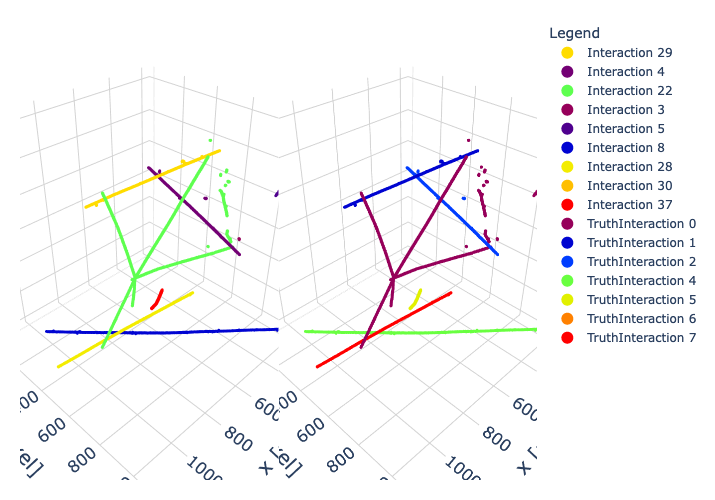

In [117]:
make_plots = True
if make_plots:
    fig = make_subplots(rows=1, cols=2,
                        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                        horizontal_spacing=0.05, vertical_spacing=0.04)

    fig.add_traces(traces_reco, rows=len(traces_reco) * [1], cols=len(traces_reco) * [1])
    fig.add_traces(traces_true, rows=len(traces_true) * [1], cols=len(traces_true) * [2])

    fig.layout = plotly_layout3d()
    fig.update_layout(showlegend=True,
                      legend=dict(xanchor="left"),
                     autosize=True,
                     height=500,
                     width=1000,
                     margin=dict(r=20, l=20, b=20, t=20))
    iplot(fig)

## 5. Exercise

 1. Implement the function `get_truth_vertices` and fill the missing `vertex` attributes for `truth_interactions`, and check their validity by using the `scatter_vertices=True` option in `get_event_displays`. You may use the following information:
  * `data['cluster_label']`

 Here are few useful functions that you can use to implement your function.

In [35]:
from mlreco.utils.vertex import get_vertex
from mlreco.utils.globals import VTX_COLS

In [36]:
def get_truth_vertices(interactions, entry, data : dict):
    """
    Inputs
    ------
        interactions: list of interactions to fetch true vertex information. 
        entry: the entry number for this image
        data: the data dictionary containing model inputs and labels
    
    Returns
    -------
        interactions: same list of interactions, but with each .vertex attribute filled.
    """
    pass

2. Implement the function `get_neutrino_info` and fill the neutrino information attributes:
 * `TruthInteraction.nu_interaction_type`
 * `TruthInteraction.nu_interaction_mode`
 * `TruthInteraction.nu_current_type`
 * `TruthInteraction.nu_energy_init`

You may use the following information:
 * `data['neutrinos']`
 
The `nu_id` attribute may be useful to select true neutrino(-like) events.

In [37]:
def get_neutrino_info(interactions, entry, data):
    pass